<a href="https://colab.research.google.com/github/Nikhil5566/Data-Science-Portfolio-Projects/blob/main/Adidas%20Global%20Catalogue%202026%20Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Adidas Global Catalogue 2026

## About the dataset and its Key-Insights:

The dataset contains 6643 entries and 28 columns after initial cleaning. It primarily focuses on the Indian market, as indicated by constant country_code ('IN') and currency ('INR'). The snapshot_date is also constant, suggesting a single data capture point. We observe that brand_name, market_record_source, and size_record_source are also uniform, simplifying our analysis to product-specific attributes.

Key Insights from Exploratory Data Analysis:

Product Categories and Gender Segments: Adidas caters to a diverse audience, with 'Lifestyle', 'Running', 'Football', and 'Gym & Training' being the most prominent product categories. The gender_segment is fairly distributed, with 'Men's' products having the highest count, followed by 'Unisex', 'Women's', and 'Kids'. This highlights Adidas's broad appeal across different demographics and sporting interests.

Pricing and Availability Dynamics: While price_local varies widely, indicating a broad range of products from affordable to premium, the sale_price_local was not available for direct comparison after data cleaning. However, the availability column shows that most items are IN_STOCK. Interestingly, when looking at availability_status, more products are marked as 'NOT_AVAILABLE' than 'IN_STOCK' at the product level, possibly indicating that while a product line might exist, specific sizes or color variations within it might frequently be out of stock, leading to a 'not available' status for the overall product entry.

Numerical Variable Relationships:

price_local and size_count (number of sizes offered for a product) show a complex relationship, with higher-priced items not necessarily correlating with more size options, and vice-versa. This might suggest pricing strategies are independent of the sheer breadth of size availability.
size_count and available_size_count (number of sizes currently in stock) are, as expected, positively correlated, meaning products with more total sizes tend to have more sizes available.
seen_market_count (how many global markets a product is seen in) often varies across product categories, suggesting certain categories (e.g., Football) might have a wider global footprint compared to others, implying distinct international marketing and distribution strategies.
Multivariate Analysis Highlights: When examining the relationship between numerical features like price_local and seen_market_count, and coloring these plots by gender_segment or category, we observe that certain gender_segment and category combinations tend to cluster around specific price points or global market penetrations. For instance, 'Men's' or 'Unisex' products in 'Lifestyle' or 'Running' categories might show a higher seen_market_count on average, or particular price ranges.

In essence, the dataset offers a valuable snapshot of Adidas's retail operations in India, revealing insights into product segmentation, inventory management challenges, and the potential for category-specific global market strategies. It also prompts further questions about the interplay between pricing, availability, and product popularity within different segments.



In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Installing Kaggle API
!pip install -q kaggle

# Uploading kaggle.json
from google.colab import files
files.upload()

# Moving kaggle.json to ~/.kaggle/
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Downloading the dataset using Kaggle API
!kaggle datasets download -d bsthere/adidas-global-catalogue-2026

# Unziping the downloaded file
!unzip adidas-global-catalogue-2026.zip

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/bsthere/adidas-global-catalogue-2026
License(s): CC0-1.0
  0% 0.00/1.64M [00:00<?, ?B/s]
100% 1.64M/1.64M [00:00<00:00, 705MB/s]
Archive:  adidas-global-catalogue-2026.zip
  inflating: Adidas_Global.csv       
  inflating: BR_Adidas.csv           
  inflating: CN_Adidas.csv           
  inflating: DE_Adidas.csv           
  inflating: FR_Adidas.csv           
  inflating: GB_Adidas.csv           
  inflating: IN_Adidas.csv           
  inflating: JP_Adidas.csv           
  inflating: KR_Adidas.csv           
  inflating: MX_Adidas.csv           
  inflating: US_Adidas.csv           


In [25]:
df = pd.read_csv('IN_Adidas.csv')
df.head(11)

,snapshot_date,country_code,product_name,model_number,currency,price_local,sale_price_local,gender_segment,size_label,category,...,rating_count,badge_texts,product_url,canonical_url,image_url,best_for_ids,seen_market_count,seen_markets,market_record_source,size_record_source
0,2026-03-09,IN,3-Stripes Polo Tee,KWG01,INR,1499.0,1499.0,M,2XL,Lifestyle,...,5.0,NaN,https://www.adidas.co.in/3-stripes-polo-tee/JE...,https://www.adidas.co.in/3-stripes-polo-tee/JE...,"https://assets.adidas.com/images/w_600,f_auto,...",[],1,IN,api,api_exact
1,2026-03-09,IN,3-Stripes Polo Tee,KWG01,INR,1499.0,1499.0,M,L,Lifestyle,...,5.0,NaN,https://www.adidas.co.in/3-stripes-polo-tee/JE...,https://www.adidas.co.in/3-stripes-polo-tee/JE...,"https://assets.adidas.com/images/w_600,f_auto,...",[],1,IN,api,api_exact
2,2026-03-09,IN,3-Stripes Polo Tee,KWG01,INR,1499.0,1499.0,M,M,Lifestyle,...,5.0,NaN,https://www.adidas.co.in/3-stripes-polo-tee/JE...,https://www.adidas.co.in/3-stripes-polo-tee/JE...,"https://assets.adidas.com/images/w_600,f_auto,...",[],1,IN,api,api_exact
3,2026-03-09,IN,3-Stripes Polo Tee,KWG01,INR,1499.0,1499.0,M,S,Lifestyle,...,5.0,NaN,https://www.adidas.co.in/3-stripes-polo-tee/JE...,https://www.adidas.co.in/3-stripes-polo-tee/JE...,"https://assets.adidas.com/images/w_600,f_auto,...",[],1,IN,api,api_exact
4,2026-03-09,IN,3-Stripes Polo Tee,KWG01,INR,1499.0,1499.0,M,XL,Lifestyle,...,5.0,NaN,https://www.adidas.co.in/3-stripes-polo-tee/JE...,https://www.adidas.co.in/3-stripes-polo-tee/JE...,"https://assets.adidas.com/images/w_600,f_auto,...",[],1,IN,api,api_exact
5,2026-03-09,IN,3-Stripes Polo Tee,KWG01,INR,1499.0,1499.0,M,XS,Lifestyle,...,5.0,NaN,https://www.adidas.co.in/3-stripes-polo-tee/JE...,https://www.adidas.co.in/3-stripes-polo-tee/JE...,"https://assets.adidas.com/images/w_600,f_auto,...",[],1,IN,api,api_exact
6,2026-03-09,IN,ADIFOM Iinfinity Mules,OTH83,INR,6599.0,6599.0,U,10,Basketball,...,-99.0,NaN,https://www.adidas.co.in/adifom-iinfinity-mule...,https://www.adidas.co.in/adifom-iinfinity-mule...,"https://assets.adidas.com/images/w_600,f_auto,...","[""Off-Court""]",1,IN,api,api_exact
7,2026-03-09,IN,ADIFOM Iinfinity Mules,OTH83,INR,6599.0,6599.0,U,11,Basketball,...,-99.0,NaN,https://www.adidas.co.in/adifom-iinfinity-mule...,https://www.adidas.co.in/adifom-iinfinity-mule...,"https://assets.adidas.com/images/w_600,f_auto,...","[""Off-Court""]",1,IN,api,api_exact
8,2026-03-09,IN,ADIFOM Iinfinity Mules,OTH83,INR,6599.0,6599.0,U,12,Basketball,...,-99.0,NaN,https://www.adidas.co.in/adifom-iinfinity-mule...,https://www.adidas.co.in/adifom-iinfinity-mule...,"https://assets.adidas.com/images/w_600,f_auto,...","[""Off-Court""]",1,IN,api,api_exact
9,2026-03-09,IN,ADIFOM Iinfinity Mules,OTH83,INR,6599.0,6599.0,U,13,Basketball,...,-99.0,NaN,https://www.adidas.co.in/adifom-iinfinity-mule...,https://www.adidas.co.in/adifom-iinfinity-mule...,"https://assets.adidas.com/images/w_600,f_auto,...","[""Off-Court""]",1,IN,api,api_exact


In [4]:
df.tail(11)

,snapshot_date,country_code,product_name,model_number,currency,price_local,sale_price_local,gender_segment,size_label,category,...,rating_count,badge_texts,product_url,canonical_url,image_url,best_for_ids,seen_market_count,seen_markets,market_record_source,size_record_source
6632,2026-03-09,IN,adilette Comfort MER Slides,OMW51,INR,5599.0,5599.0,U,14,Motorsport,...,66.0,NaN,https://www.adidas.co.in/adilette-comfort-mer-...,https://www.adidas.co.in/adilette-comfort-mer-...,"https://assets.adidas.com/images/w_600,f_auto,...",[],1,IN,api,api_exact
6633,2026-03-09,IN,adilette Comfort MER Slides,OMW51,INR,5599.0,5599.0,U,15,Motorsport,...,66.0,NaN,https://www.adidas.co.in/adilette-comfort-mer-...,https://www.adidas.co.in/adilette-comfort-mer-...,"https://assets.adidas.com/images/w_600,f_auto,...",[],1,IN,api,api_exact
6634,2026-03-09,IN,adilette Comfort MER Slides,OMW51,INR,5599.0,5599.0,U,16,Motorsport,...,66.0,NaN,https://www.adidas.co.in/adilette-comfort-mer-...,https://www.adidas.co.in/adilette-comfort-mer-...,"https://assets.adidas.com/images/w_600,f_auto,...",[],1,IN,api,api_exact
6635,2026-03-09,IN,adilette Comfort MER Slides,OMW51,INR,5599.0,5599.0,U,17,Motorsport,...,66.0,NaN,https://www.adidas.co.in/adilette-comfort-mer-...,https://www.adidas.co.in/adilette-comfort-mer-...,"https://assets.adidas.com/images/w_600,f_auto,...",[],1,IN,api,api_exact
6636,2026-03-09,IN,adilette Comfort MER Slides,OMW51,INR,5599.0,5599.0,U,18,Motorsport,...,66.0,NaN,https://www.adidas.co.in/adilette-comfort-mer-...,https://www.adidas.co.in/adilette-comfort-mer-...,"https://assets.adidas.com/images/w_600,f_auto,...",[],1,IN,api,api_exact
6637,2026-03-09,IN,adilette Comfort MER Slides,OMW51,INR,5599.0,5599.0,U,4,Motorsport,...,66.0,NaN,https://www.adidas.co.in/adilette-comfort-mer-...,https://www.adidas.co.in/adilette-comfort-mer-...,"https://assets.adidas.com/images/w_600,f_auto,...",[],1,IN,api,api_exact
6638,2026-03-09,IN,adilette Comfort MER Slides,OMW51,INR,5599.0,5599.0,U,5,Motorsport,...,66.0,NaN,https://www.adidas.co.in/adilette-comfort-mer-...,https://www.adidas.co.in/adilette-comfort-mer-...,"https://assets.adidas.com/images/w_600,f_auto,...",[],1,IN,api,api_exact
6639,2026-03-09,IN,adilette Comfort MER Slides,OMW51,INR,5599.0,5599.0,U,6,Motorsport,...,66.0,NaN,https://www.adidas.co.in/adilette-comfort-mer-...,https://www.adidas.co.in/adilette-comfort-mer-...,"https://assets.adidas.com/images/w_600,f_auto,...",[],1,IN,api,api_exact
6640,2026-03-09,IN,adilette Comfort MER Slides,OMW51,INR,5599.0,5599.0,U,7,Motorsport,...,66.0,NaN,https://www.adidas.co.in/adilette-comfort-mer-...,https://www.adidas.co.in/adilette-comfort-mer-...,"https://assets.adidas.com/images/w_600,f_auto,...",[],1,IN,api,api_exact
6641,2026-03-09,IN,adilette Comfort MER Slides,OMW51,INR,5599.0,5599.0,U,8,Motorsport,...,66.0,NaN,https://www.adidas.co.in/adilette-comfort-mer-...,https://www.adidas.co.in/adilette-comfort-mer-...,"https://assets.adidas.com/images/w_600,f_auto,...",[],1,IN,api,api_exact


In [5]:
df.shape

(6643, 35)

In [6]:
df.columns

Index(['snapshot_date', 'country_code', 'product_name', 'model_number',
       'currency', 'price_local', 'sale_price_local', 'gender_segment',
       'size_label', 'category', 'subcategory', 'product_id', 'sku',
       'base_model_number', 'brand_name', 'color_name', 'size_count',
       'size_labels', 'available_size_count', 'availability',
       'availability_units', 'availability_status', 'in_stock', 'discount_pct',
       'rating', 'rating_count', 'badge_texts', 'product_url', 'canonical_url',
       'image_url', 'best_for_ids', 'seen_market_count', 'seen_markets',
       'market_record_source', 'size_record_source'],
      dtype='object')

In [7]:
df.dtypes

,0
snapshot_date,object
country_code,object
product_name,object
model_number,object
currency,object
price_local,float64
sale_price_local,float64
gender_segment,object
size_label,object
category,object


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6643 entries, 0 to 6642
Data columns (total 35 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   snapshot_date         6643 non-null   object 
 1   country_code          6643 non-null   object 
 2   product_name          6643 non-null   object 
 3   model_number          6643 non-null   object 
 4   currency              6643 non-null   object 
 5   price_local           6643 non-null   float64
 6   sale_price_local      5293 non-null   float64
 7   gender_segment        6643 non-null   object 
 8   size_label            6643 non-null   object 
 9   category              6643 non-null   object 
 10  subcategory           4995 non-null   object 
 11  product_id            6643 non-null   object 
 12  sku                   6643 non-null   object 
 13  base_model_number     6502 non-null   object 
 14  brand_name            6643 non-null   object 
 15  color_name           

In [10]:
df.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
snapshot_date,6643,1,2026-03-09,6643,NaN,NaN,NaN,NaN,NaN,NaN,NaN
country_code,6643,1,IN,6643,NaN,NaN,NaN,NaN,NaN,NaN,NaN
product_name,6643,209,Samba OG Shoes,834,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_number,6643,220,BSZ08,680,NaN,NaN,NaN,NaN,NaN,NaN,NaN
currency,6643,1,INR,6643,NaN,NaN,NaN,NaN,NaN,NaN,NaN
price_local,6643.0,NaN,NaN,NaN,9048.30423,4699.75035,699.5,5999.0,9099.5,10999.0,27999.0
sale_price_local,5293.0,NaN,NaN,NaN,8790.692424,5073.365343,699.5,5999.0,7999.5,10999.0,27999.0
gender_segment,6643,4,M,3168,NaN,NaN,NaN,NaN,NaN,NaN,NaN
size_label,6643,199,6,279,NaN,NaN,NaN,NaN,NaN,NaN,NaN
category,6643,9,Lifestyle,2439,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
df.isnull().sum()

,0
snapshot_date,0
country_code,0
product_name,0
model_number,0
currency,0
price_local,0
sale_price_local,1350
gender_segment,0
size_label,0
category,0


In [23]:
df.drop(['badge_texts','rating_count','rating','discount_pct','color_name','subcategory'], axis = 1, inplace = True, errors='ignore')
df.isnull().sum()

,0
snapshot_date,0
country_code,0
product_name,0
model_number,0
currency,0
price_local,0
gender_segment,0
size_label,0
category,0
product_id,0


In [14]:
df.duplicated().sum()

np.int64(0)

# Univariate Analysis

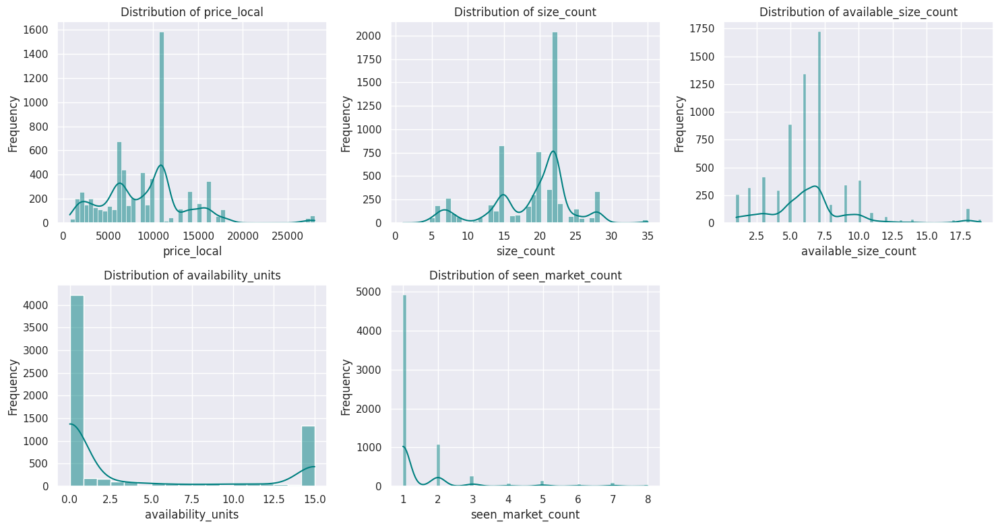

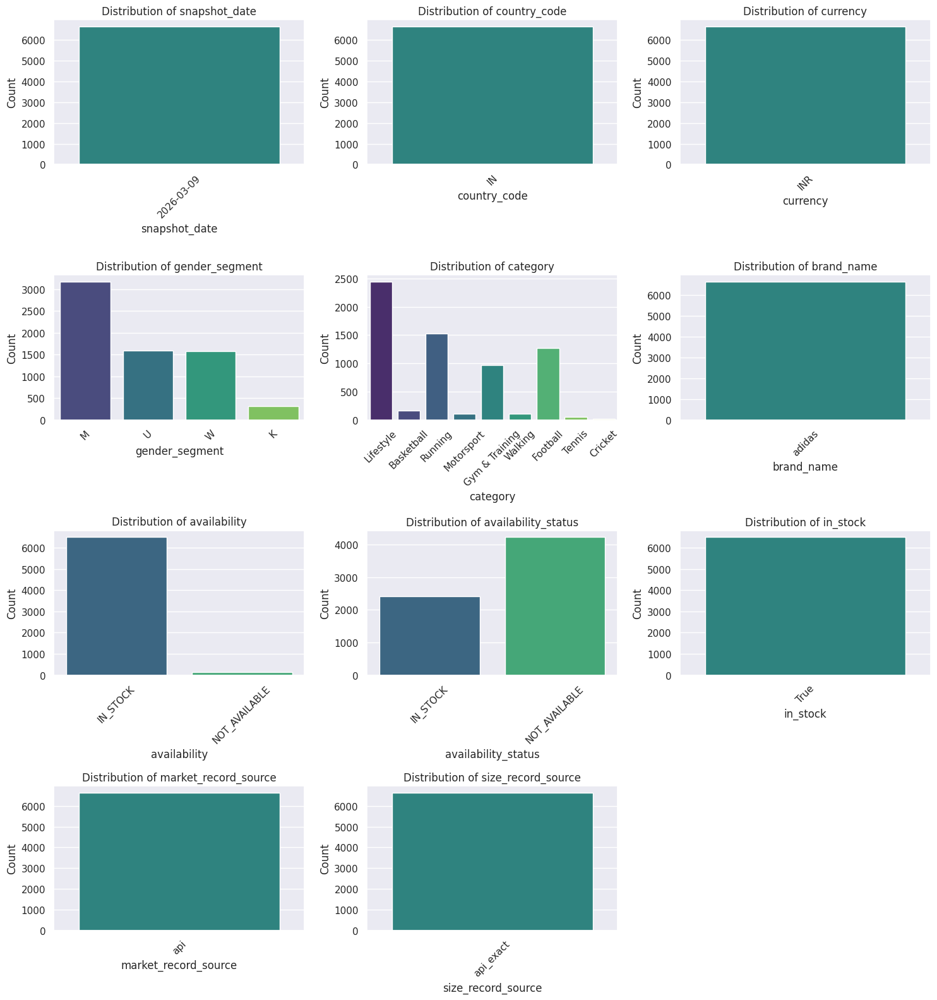

--- Categorical Value Counts ---

Value counts for snapshot_date:
snapshot_date
2026-03-09    6643
Name: count, dtype: int64

Value counts for country_code:
country_code
IN    6643
Name: count, dtype: int64

Value counts for currency:
currency
INR    6643
Name: count, dtype: int64

Value counts for gender_segment:
gender_segment
M    3168
U    1589
W    1573
K     313
Name: count, dtype: int64

Value counts for category:
category
Lifestyle         2439
Running           1524
Football          1273
Gym & Training     971
Basketball         164
Motorsport         108
Walking            104
Tennis              46
Cricket             14
Name: count, dtype: int64

Value counts for brand_name:
brand_name
adidas    6643
Name: count, dtype: int64

Value counts for availability:
availability
IN_STOCK         6489
NOT_AVAILABLE     154
Name: count, dtype: int64

Value counts for availability_status:
availability_status
NOT_AVAILABLE    4225
IN_STOCK         2418
Name: count, dtype: int64

Value 

In [15]:
import math

# --- 1. Numerical Columns (Histograms in a Grid) ---
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

if len(numerical_cols) > 0:
    # Defining grid size
    num_plots = len(numerical_cols)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    axes = axes.flatten()

    # Iterating and plot
    for i, col in enumerate(numerical_cols):
        sns.histplot(data=df, x=col, kde=True, ax=axes[i], color='teal') # Added color
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Frequency')

    # Hiding any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No numerical columns found.")


# --- 2. Categorical Columns (Countplots in a Grid) ---
# Filtering out columns with too many unique values (like IDs) to avoid messy plots
categorical_cols = [c for c in df.select_dtypes(include='object').columns if df[c].nunique() < 20]

if len(categorical_cols) > 0:
    # Defining grid size
    num_plots = len(categorical_cols)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    axes = axes.flatten()

    # Iterating and plot
    for i, col in enumerate(categorical_cols):
        sns.countplot(data=df, x=col, ax=axes[i], palette='viridis', hue=col, legend=False) # Added palette
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Count')
        axes[i].tick_params(axis='x', rotation=45)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

     # --- 3. Value Counts (Text Output) ---
    print("--- Categorical Value Counts ---")
    for col in categorical_cols:
        print(f"\nValue counts for {col}:")
        print(df[col].value_counts())
else:
    print("No categorical columns found (or all have high cardinality).")

# Bivariate Analysis

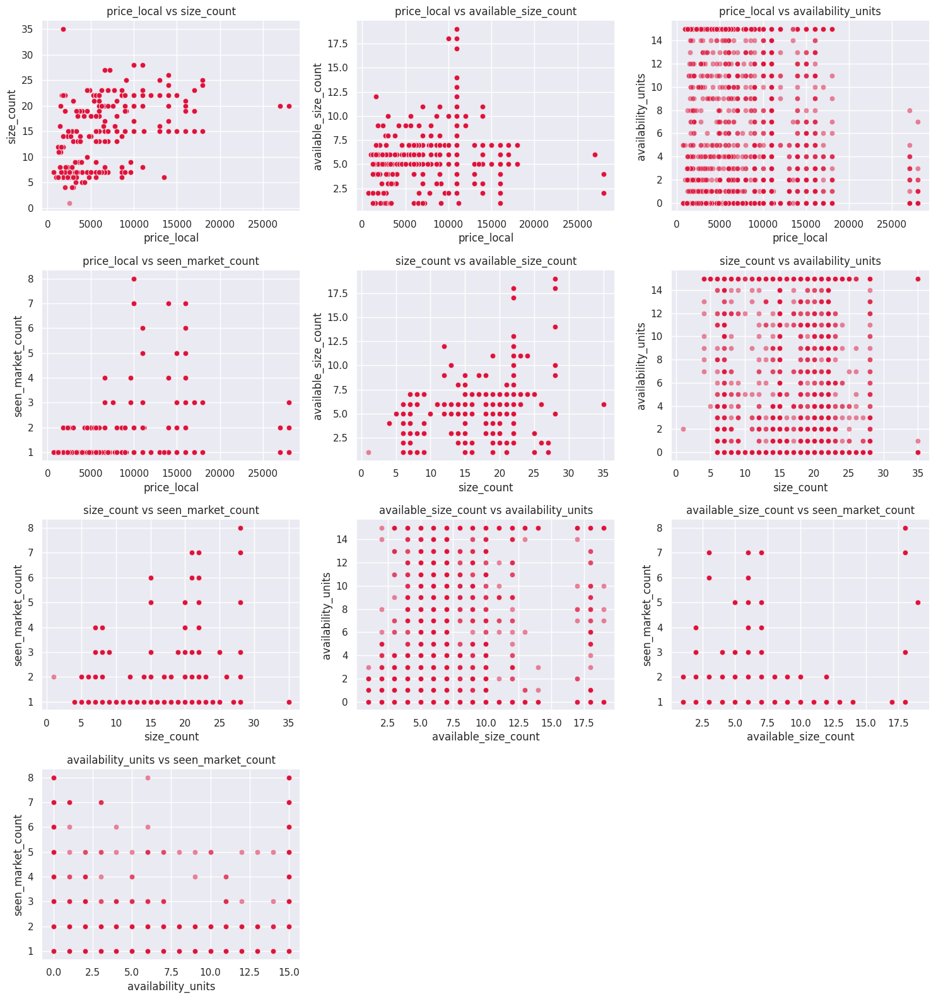

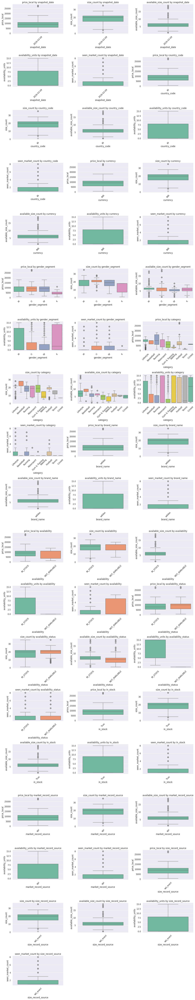

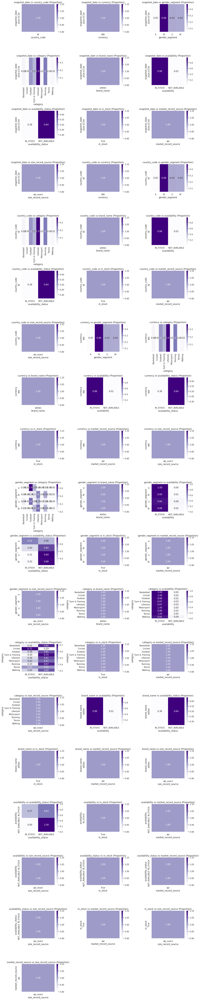

In [16]:
import itertools

# --- 1. Numerical-Numerical Relationships (Scatter Plots) ---
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Generating all unique pairs of numerical columns
num_pairs = list(itertools.combinations(numerical_cols, 2))

if len(num_pairs) > 0:
    # Defining grid size
    num_plots = len(num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    # Iterating through pairs and plot
    for i, (col1, col2) in enumerate(num_pairs):
        sns.scatterplot(data=df, x=col1, y=col2, ax=axes[i], alpha=0.5, color='crimson') # Added color
        axes[i].set_title(f'{col1} vs {col2}')
        axes[i].set_xlabel(col1)
        axes[i].set_ylabel(col2)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Not enough numerical columns for scatter plots.")


# --- 2. Categorical-Numerical Relationships (Box Plots) ---
# Excluding high cardinality columns
categorical_cols = [c for c in df.select_dtypes(include='object').columns if df[c].nunique() < 20]
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Generating all pairs of (Categorical, Numerical)
cat_num_pairs = list(itertools.product(categorical_cols, numerical_cols))

if len(cat_num_pairs) > 0:
    # Defining grid size
    num_plots = len(cat_num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    # Iterating through pairs and plot
    for i, (cat_col, num_col) in enumerate(cat_num_pairs):
        sns.boxplot(data=df, x=cat_col, y=num_col, ax=axes[i], palette='Set2', hue=cat_col, legend=False)
        axes[i].set_title(f'{num_col} by {cat_col}')
        axes[i].set_xlabel(cat_col)
        axes[i].set_ylabel(num_col)
        axes[i].tick_params(axis='x', rotation=45)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No categorical-numerical pairs found.")


# --- 3. Categorical-Categorical Relationships (Heatmaps) ---
# Generating pairs of categorical columns
cat_pairs = list(itertools.combinations(categorical_cols, 2))

if len(cat_pairs) > 0:
    num_plots = len(cat_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    for i, (col1, col2) in enumerate(cat_pairs):
        # Creating a cross-tabulation
        crosstab = pd.crosstab(df[col1], df[col2], normalize='index')
        sns.heatmap(crosstab, annot=True, fmt='.2f', cmap='Purples', ax=axes[i])
        axes[i].set_title(f'{col1} vs {col2} (Proportion)')

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Multivariate Analysis


Analyzing relationships with Hue: snapshot_date...


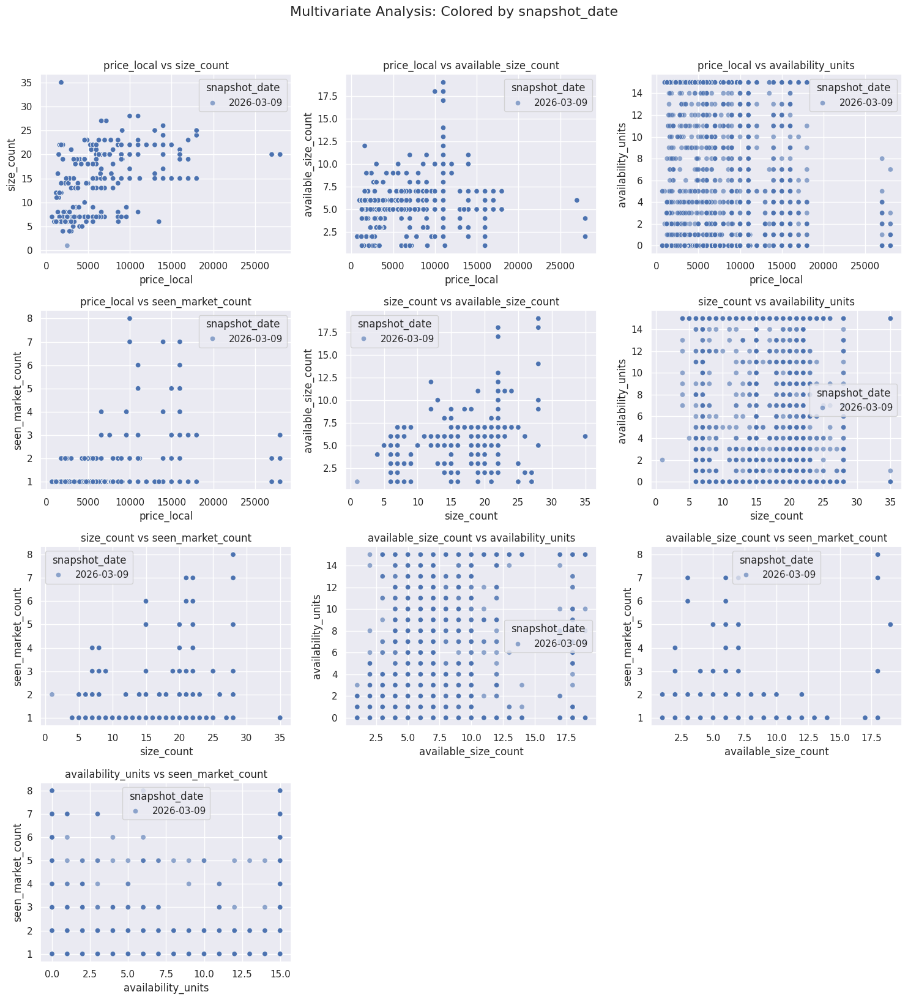


Analyzing relationships with Hue: country_code...


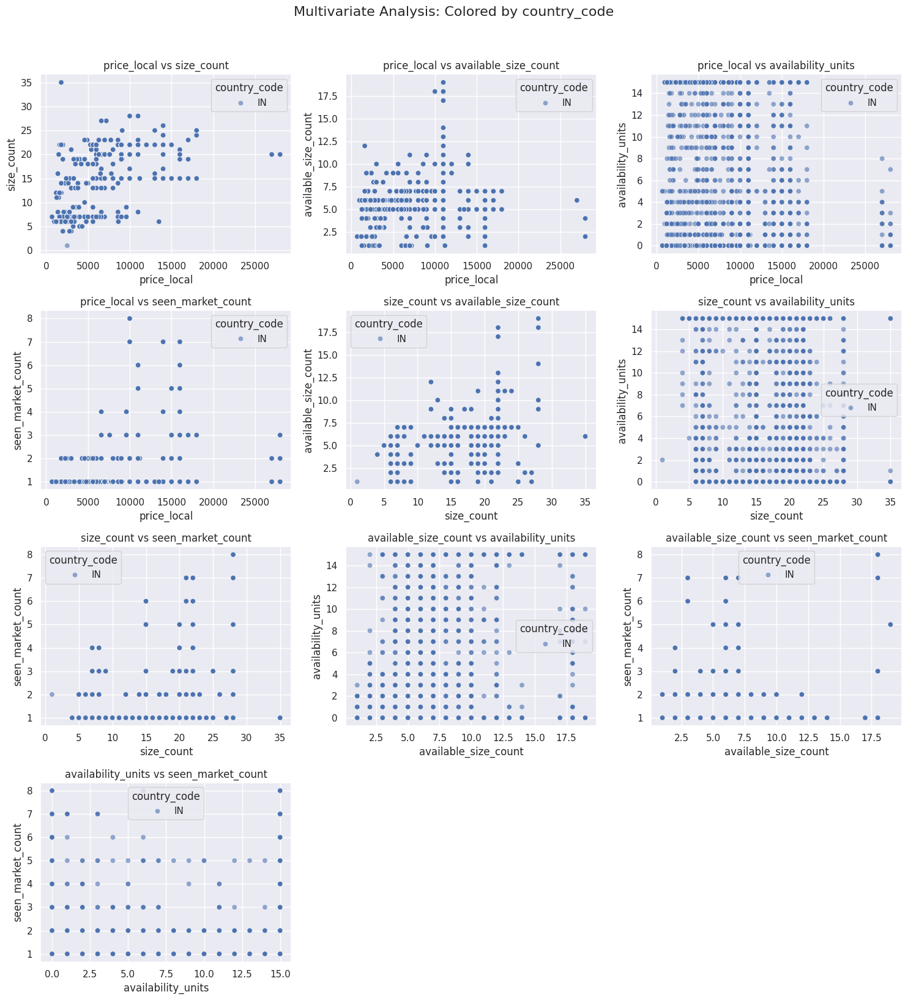


Analyzing relationships with Hue: currency...


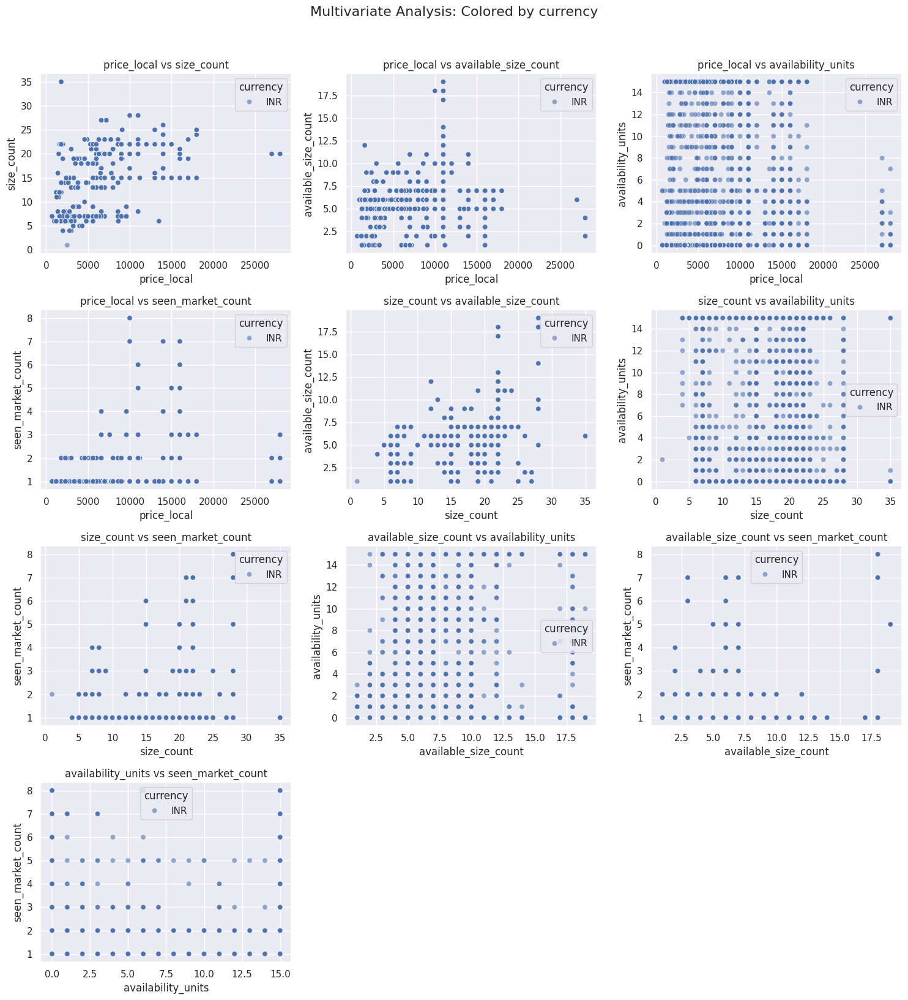


Analyzing relationships with Hue: gender_segment...


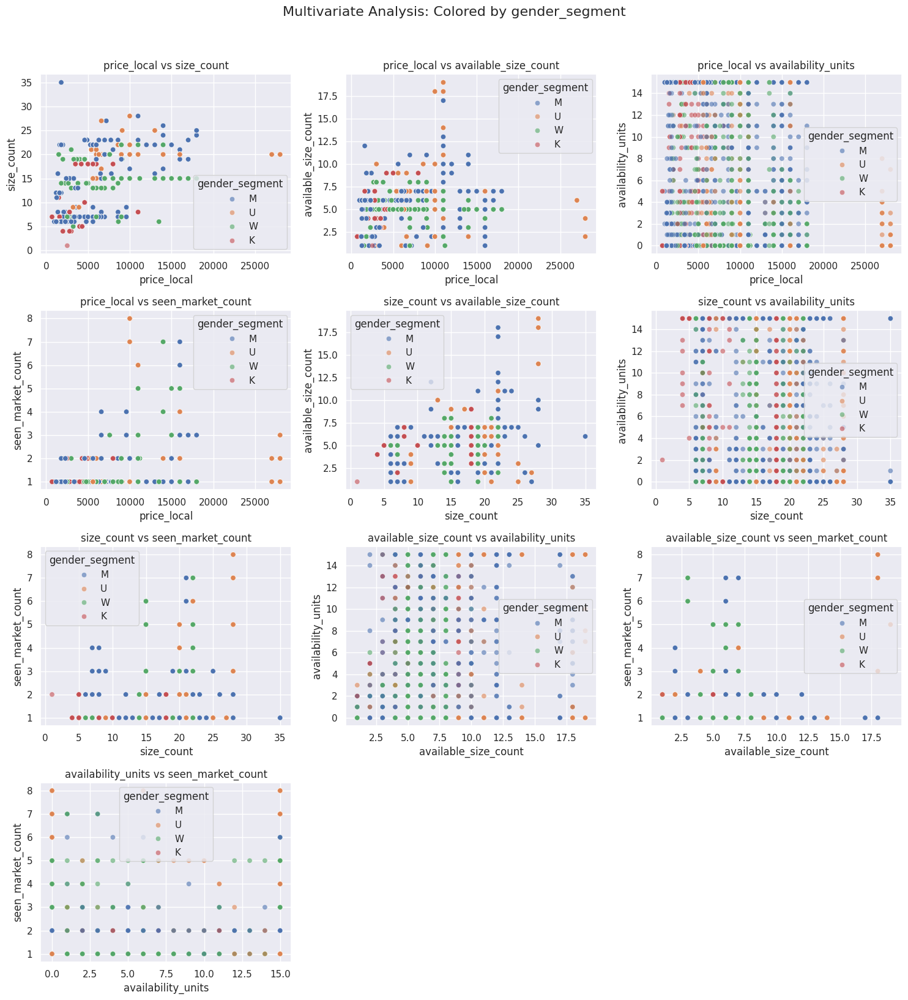


Analyzing relationships with Hue: category...


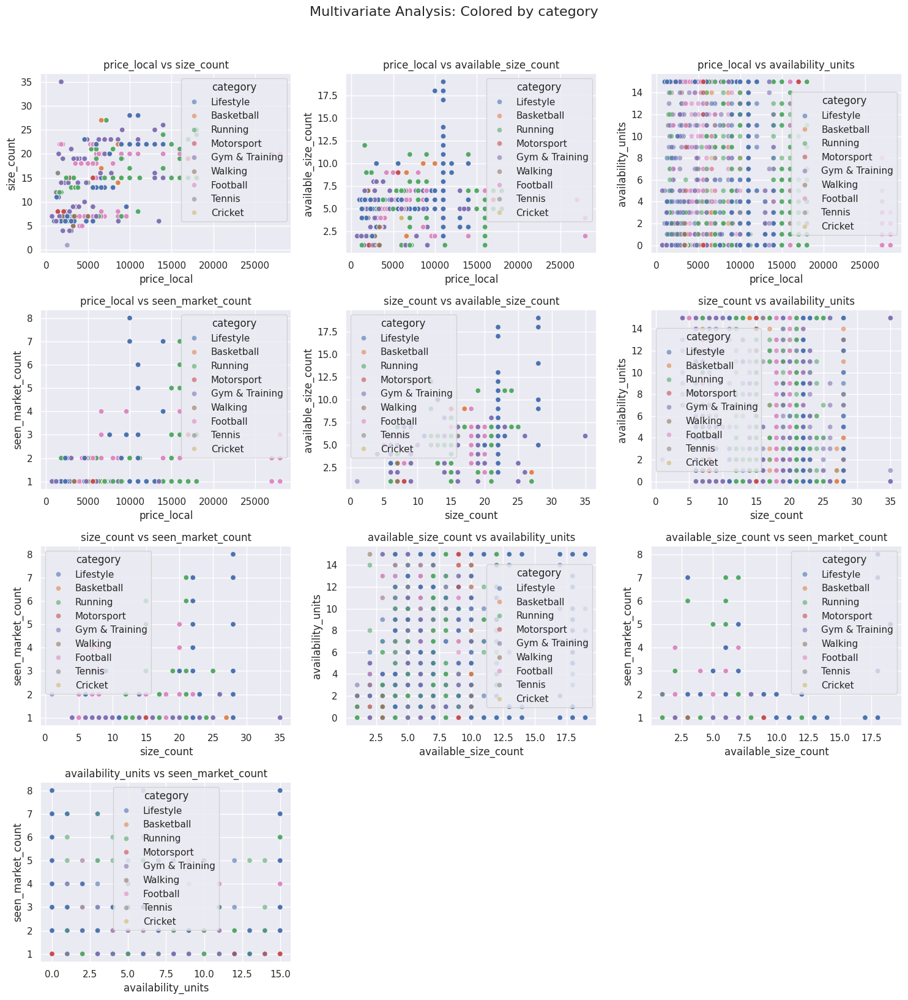


Analyzing relationships with Hue: brand_name...


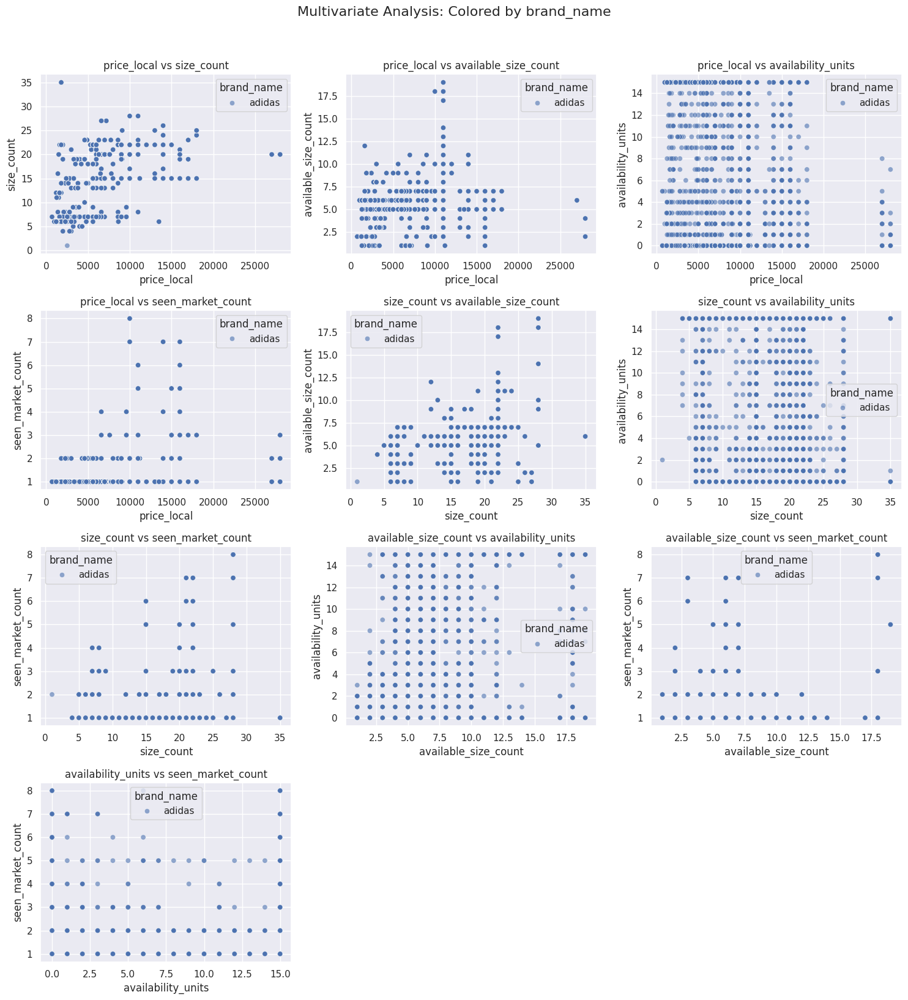


Analyzing relationships with Hue: availability...


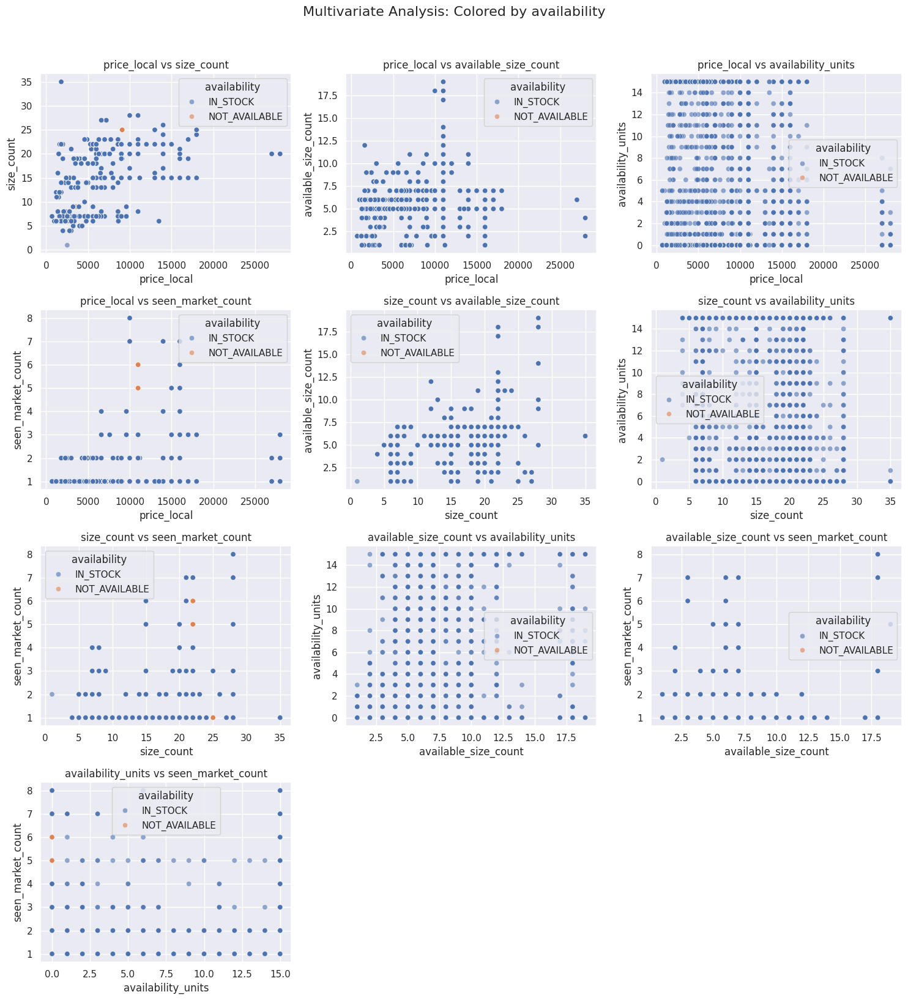


Analyzing relationships with Hue: availability_status...


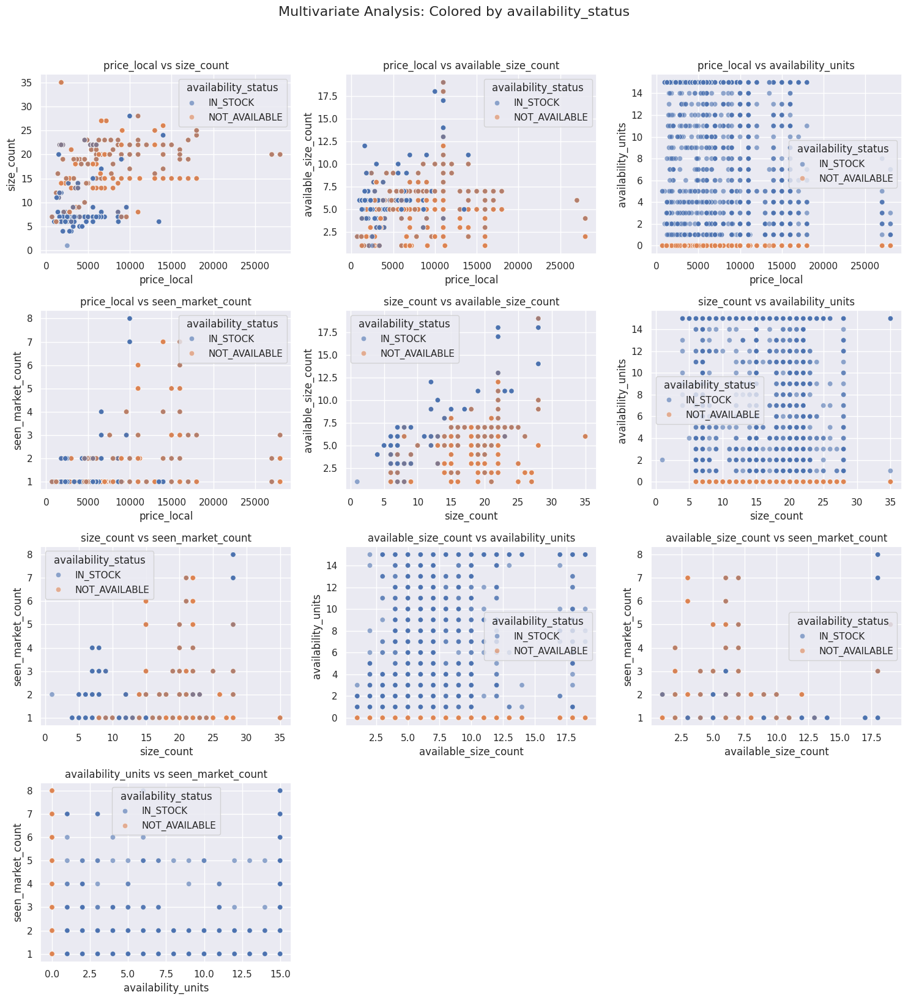


Analyzing relationships with Hue: in_stock...


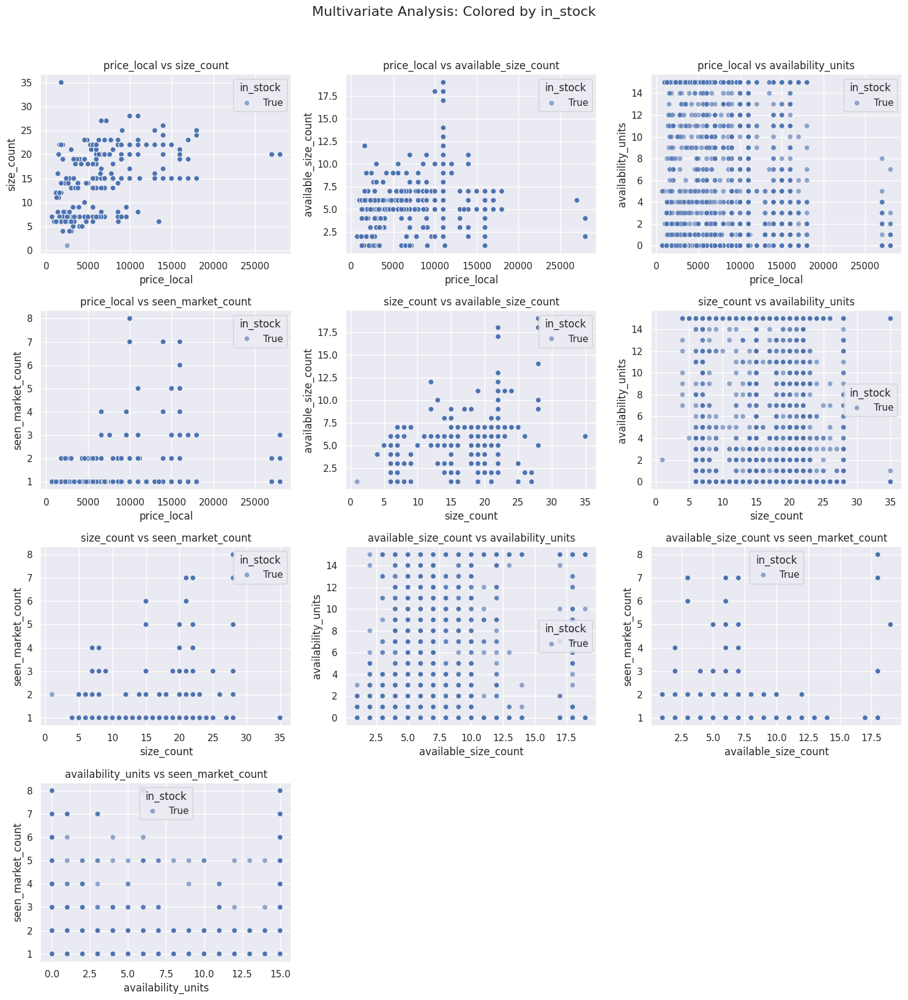


Analyzing relationships with Hue: market_record_source...


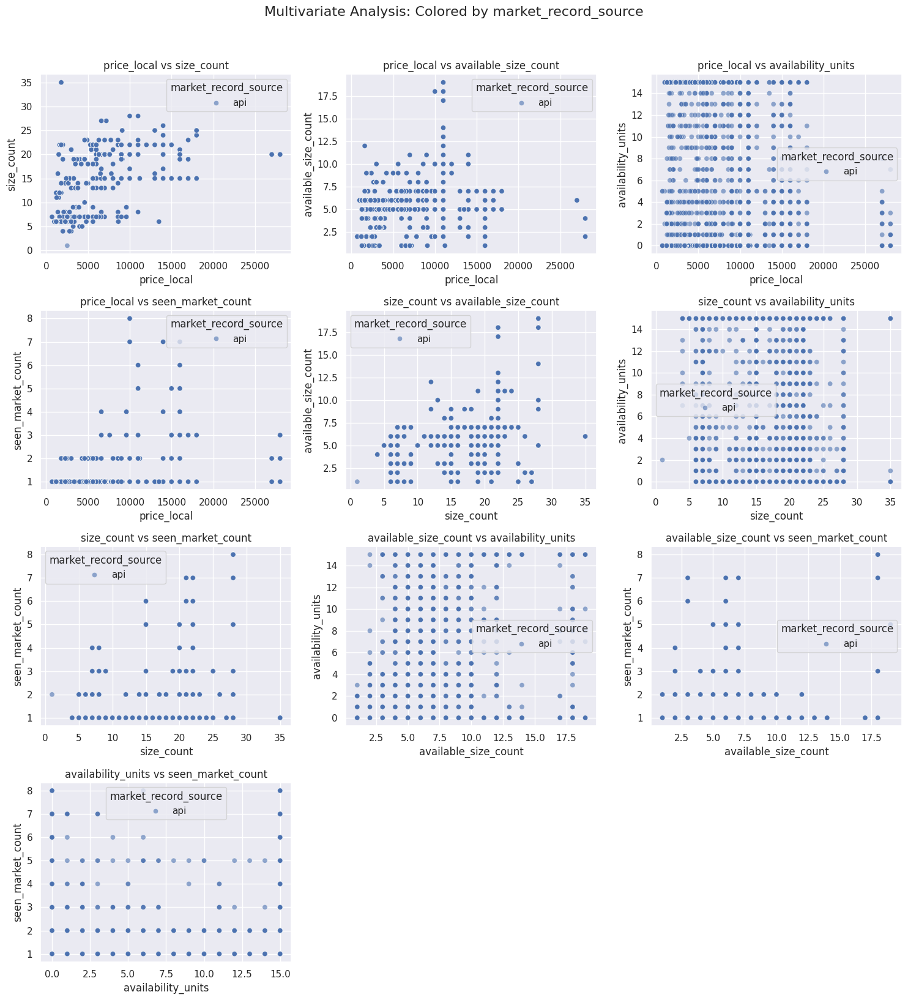


Analyzing relationships with Hue: size_record_source...


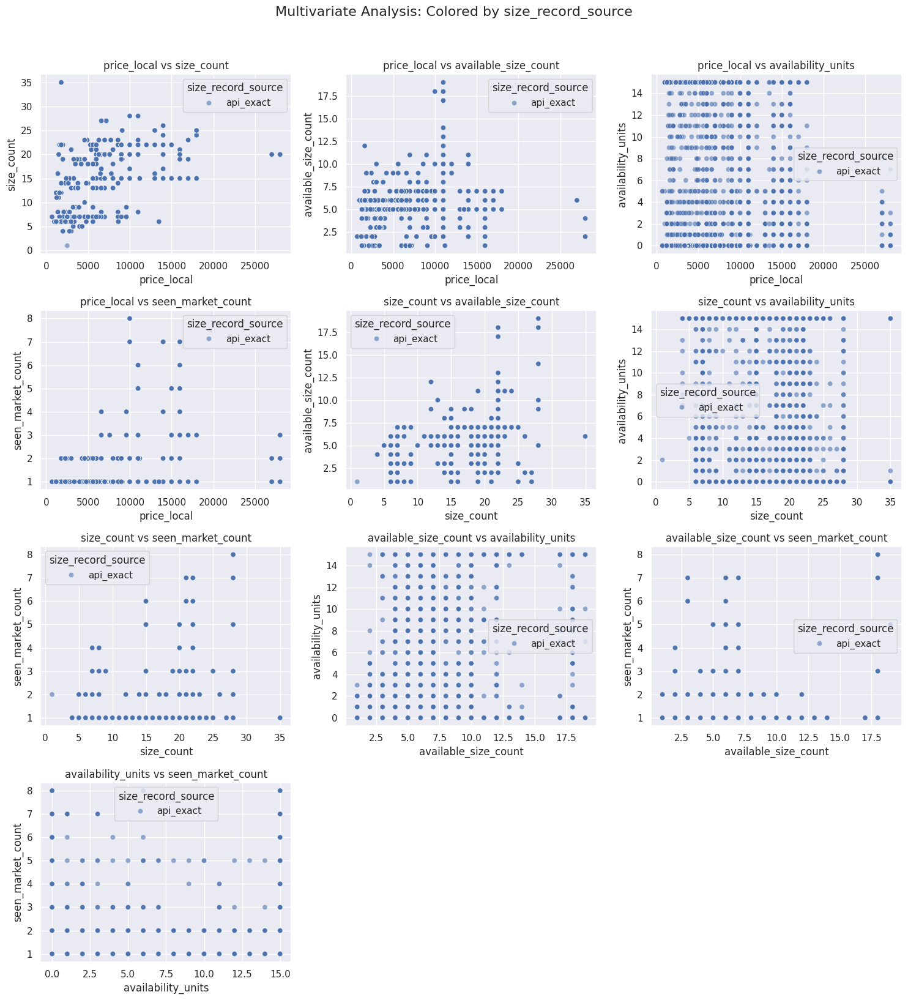

In [17]:
import itertools
import math

# --- Multivariate Analysis: Numerical Pairs with Categorical Hue ---

# 1. Identifying valid columns
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()
# Filtering categorical columns to those with few unique values for clear legends (e.g., < 10)
categorical_cols = [c for c in df.select_dtypes(include='object').columns if df[c].nunique() < 10]

# Generating pairs of numerical columns to plot
num_pairs = list(itertools.combinations(numerical_cols, 2))

if len(numerical_cols) > 1 and len(categorical_cols) > 0:
    # OUTER LOOP: Iterating through each categorical variable to use as the 'Hue'
    for cat_col in categorical_cols:
        print(f"\nAnalyzing relationships with Hue: {cat_col}...")

        # Defining grid size for the inner loop (numerical pairs)
        num_plots = len(num_pairs)
        num_cols_plot = 3
        num_rows_plot = math.ceil(num_plots / num_cols_plot)

        # Creating figure
        fig, axes = plt.subplots(num_rows_plot, num_cols_plot, figsize=(15, 4 * num_rows_plot))
        if num_plots > 1:
             axes = axes.flatten()
        else:
             axes = [axes]

        # INNER LOOP: Iterating through numerical pairs
        for i, (num1, num2) in enumerate(num_pairs):
            sns.scatterplot(data=df, x=num1, y=num2, hue=cat_col, ax=axes[i], alpha=0.6)
            axes[i].set_title(f'{num1} vs {num2}')

        # Hiding unused subplots
        for j in range(i + 1, len(axes)):
            axes[j].axis('off')

        plt.suptitle(f'Multivariate Analysis: Colored by {cat_col}', y=1.02, fontsize=16)
        plt.tight_layout()
        plt.show()
        print("="*80)
else:
    print("Not enough data for multivariate scatter analysis (need >1 numerical and >0 categorical columns).")

# Pairplot

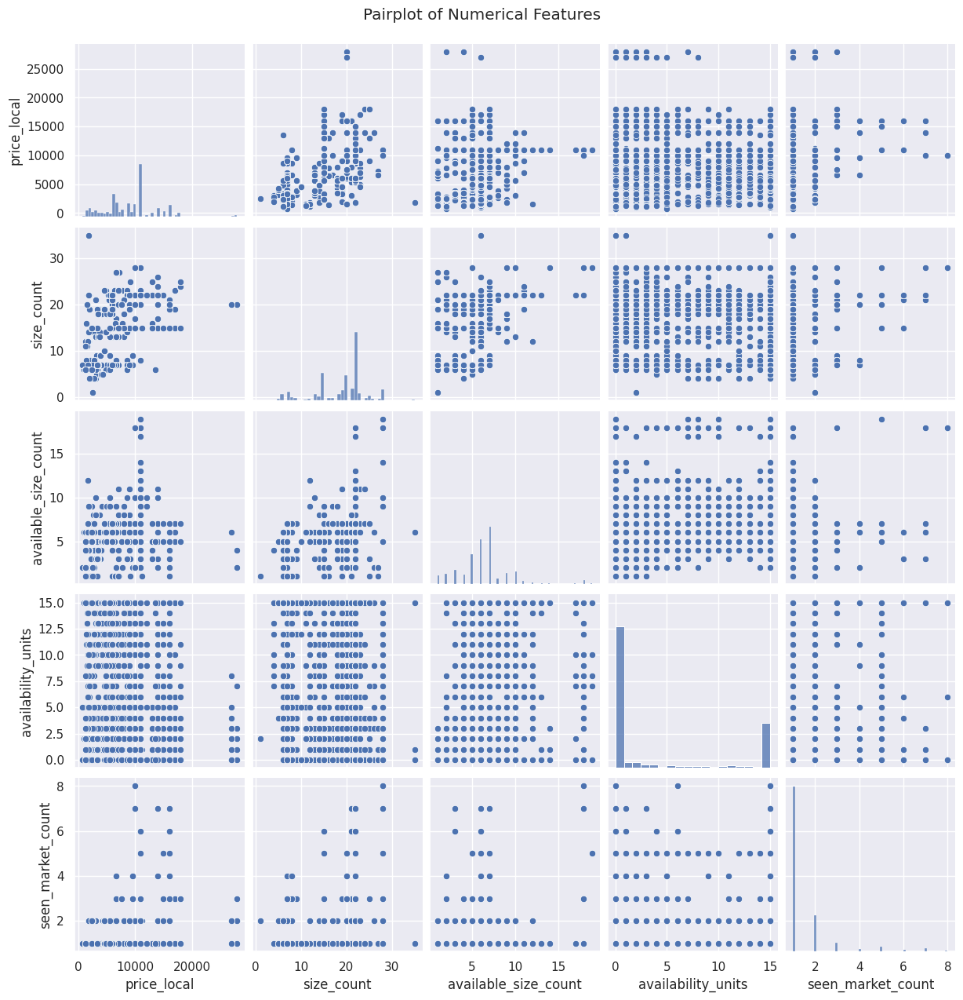

In [18]:
sns.pairplot(df.select_dtypes(include = np.number))
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.show()

# Heatmap

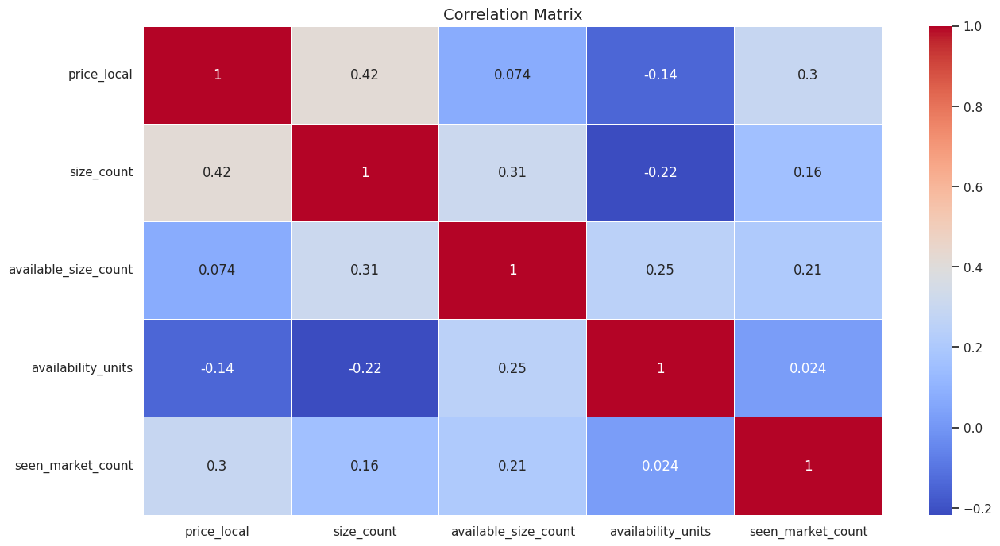

In [19]:
plt.figure(figsize=(15, 8))
sns.heatmap(df.corr(numeric_only = True), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix", fontsize=14)
plt.show()

# Thank You